In [57]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [58]:
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from PIL import Image
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import Sequential, Model
from keras.layers import (Conv2D, MaxPooling2D, Dense, Flatten, \
                          Dropout, Input,GlobalAveragePooling2D,BatchNormalization)
from tensorflow.keras.activations import softmax
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from mpl_toolkits.axes_grid1 import ImageGrid
from keras.models import Model
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import (ConfusionMatrixDisplay, confusion_matrix, \
                             accuracy_score)
import cv2

In [59]:
our_folders = ['Acne and Rosacea Photos', \
              'Atopic Dermatitis Photos', \
              'Herpes HPV and other STDs Photos']

In [60]:
root_dir = '../input/dermnet/train'

In [61]:
test_dir = '../input/dermnet/test'

In [62]:
acne_train_path = os.path.join(root_dir,'Acne and Rosacea Photos')
atopic_train_path = os.path.join(root_dir, 'Atopic Dermatitis Photos')
herpes_train_path = os.path.join(root_dir, 'Herpes HPV and other STDs Photos')

In [63]:
acne_test_path = os.path.join(test_dir,'Acne and Rosacea Photos')
atopic_test_path = os.path.join(test_dir, 'Atopic Dermatitis Photos')
herpes_test_path = os.path.join(test_dir, 'Herpes HPV and other STDs Photos')

atopic_test_files = ([files_ for _, _, files_ in os.walk(atopic_test_path)])[0]
acne_test_files = ([files_ for _, _, files_ in os.walk(acne_test_path)])[0]
herpes_test_files = ([files_ for _, _, files_ in os.walk(herpes_test_path)])[0]

In [64]:
train_dirs = []
for i in our_folders:
    for folder_,_, files_ in os.walk(f'../input/dermnet/train/{i}'):
        print(folder_)
        train_dirs.append(folder_)

../input/dermnet/train/Acne and Rosacea Photos
../input/dermnet/train/Atopic Dermatitis Photos
../input/dermnet/train/Herpes HPV and other STDs Photos


In [65]:
atopic_train_files = ([files_ for _, _, files_ in os.walk(atopic_train_path)])[0]

In [66]:
acne_train_files = ([files_ for _, _, files_ in os.walk(acne_train_path)])[0]

In [67]:
herpes_train_files = ([files_ for _, _, files_ in os.walk(herpes_train_path)])[0]

In [68]:
def plotGridImages(d_name, list_files, train_path,nrows= 1, ncols=5):
    # for folder_name in our_folders:
    fig = plt.figure(1, figsize=(30, 30))
    grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=0.05)
    print(f"{d_name}")
    for i, img_id in enumerate(random.sample(list_files,ncols)):
        ax = grid[i]
        image_dir_path = os.path.join(train_path, img_id)
        img = image.load_img(image_dir_path, (224, 224))
        img = image.img_to_array(img)
        ax.imshow(img / 255.)
        ax.text(10, 200, 'LABEL: %s' % d_name, color='k', backgroundcolor='w',\
        alpha=0.8)
        ax.axis('off')
    # plt.tight_layout()
    plt.show()

Herpes


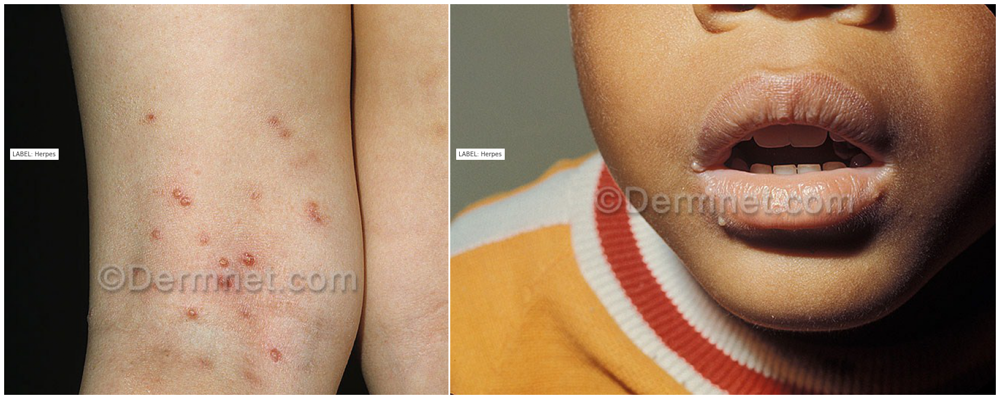

In [69]:
plotGridImages('Herpes',herpes_train_files, herpes_train_path,ncols=2)

Acne


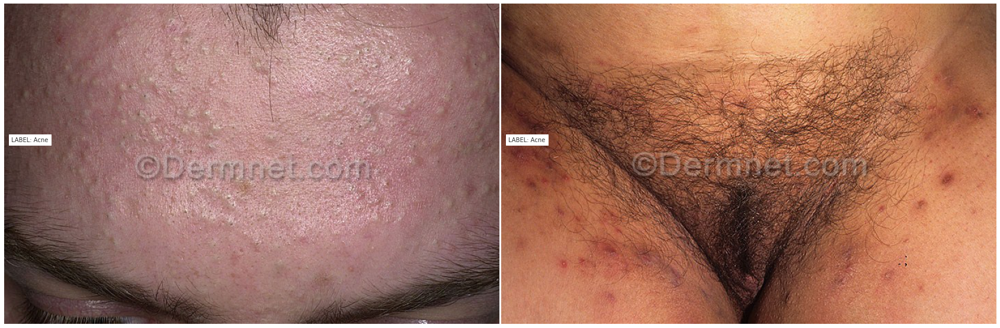

In [70]:
plotGridImages('Acne',acne_train_files, acne_train_path,ncols=2)

Atopic


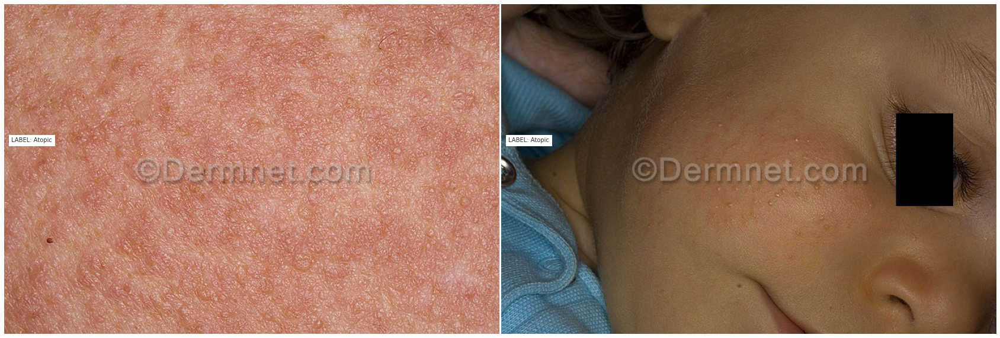

In [71]:
plotGridImages('Atopic',atopic_train_files, atopic_train_path,ncols=2)

In [72]:
final_df = pd.DataFrame()

In [73]:
herpes_df = pd.DataFrame()
herpes_df['Image'] = [herpes_train_path+'/'+img for img in herpes_train_files]
herpes_df['Label'] = "herpes"

In [74]:
herpes_df.shape

(405, 2)

In [75]:
atopic_df = pd.DataFrame()
atopic_df['Image'] =  [atopic_train_path+'/'+img for img in atopic_train_files]
atopic_df['Label'] = "atopic"

In [76]:
atopic_df.shape

(489, 2)

In [77]:
acne_df = pd.DataFrame()
acne_df['Image'] =  [acne_train_path+'/'+img for img in acne_train_files]
acne_df['Label'] = "acne"

In [78]:
acne_df.shape

(840, 2)

In [79]:
final_df = final_df.append([atopic_df, herpes_df, acne_df])

In [80]:
final_df.shape

(1734, 2)

In [81]:
final_df.sample(10)

,Image,Label
73,../input/dermnet/train/Atopic Dermatitis Photo...,atopic
26,../input/dermnet/train/Acne and Rosacea Photos...,acne
67,../input/dermnet/train/Herpes HPV and other ST...,herpes
515,../input/dermnet/train/Acne and Rosacea Photos...,acne
25,../input/dermnet/train/Herpes HPV and other ST...,herpes
348,../input/dermnet/train/Herpes HPV and other ST...,herpes
217,../input/dermnet/train/Acne and Rosacea Photos...,acne
505,../input/dermnet/train/Acne and Rosacea Photos...,acne
623,../input/dermnet/train/Acne and Rosacea Photos...,acne
293,../input/dermnet/train/Acne and Rosacea Photos...,acne


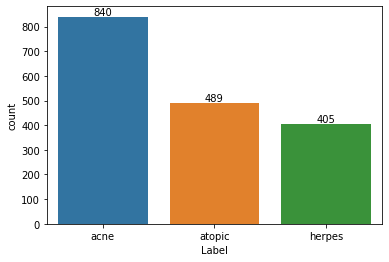

In [82]:
ax = sns.countplot(x=final_df['Label'],
                   order=final_df['Label'].value_counts(ascending=False).index);

abs_values = final_df['Label'].value_counts(ascending=False).values

ax.bar_label(container=ax.containers[0], labels=abs_values);

In [83]:
#Observation: Imabalnced dataset

In [84]:
final_test_df = pd.DataFrame()
################# melonama #########

herpes_test_df = pd.DataFrame()
herpes_test_df['Image'] = [herpes_test_path+'/'+img for img in herpes_test_files]
herpes_test_df['Label'] = "herpes"

##################  actinic  ##########

atopic_test_df = pd.DataFrame()
atopic_test_df['Image'] =  [atopic_test_path+'/'+img for img in atopic_test_files]
atopic_test_df['Label'] = "atopic"

################  acne  ##########

acne_test_df = pd.DataFrame()
acne_test_df['Image'] =  [acne_test_path+'/'+img for img in acne_test_files]
acne_test_df['Label'] = "acne"
###########################################
###########################################

final_test_df = final_test_df.append([atopic_test_df, 
                                      herpes_test_df, 
                                      acne_test_df])

final_test_df.shape

(537, 2)

In [85]:
# applying image augmentation techniques

In [86]:
train_data_gen  = ImageDataGenerator(
                                    rescale=1 / 255.0,
                                    rotation_range=40,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    horizontal_flip = True,
                                    vertical_flip = True,
                                    validation_split=0.2,
                                    fill_mode='nearest')
test_data_gen = ImageDataGenerator(rescale=1 / 255.0)

In [87]:
#earlier batchsize=8
batch_size = 128
train_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode="categorical",#sparse
    subset='training',
    shuffle=True,
    seed=42
)
valid_generator = train_data_gen.flow_from_dataframe(
    dataframe=final_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=batch_size,
    class_mode="categorical", #sparse
    subset='validation',
    shuffle=True,
    seed=42 
)
test_generator = test_data_gen.flow_from_dataframe(
    dataframe=final_test_df,
    x_col="Image",
    y_col="Label",
    target_size=(256, 256),
    batch_size=1,
    class_mode='categorical',
    shuffle=False,
)

Found 1388 validated image filenames belonging to 3 classes.
Found 346 validated image filenames belonging to 3 classes.
Found 537 validated image filenames belonging to 3 classes.


In [88]:
# VGG16 with Input shape of our Images
# Include Top is set to false to allow us to add more layers

res = VGG16(weights ='imagenet', include_top = False, 
               input_shape = (256, 256, 3)) 
               
# Setting the trainable to false
res.trainable = False



x= res.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
# x = Dropout(0.5)(x) 
x = Dense(512, activation ='relu')(x)
x = BatchNormalization()(x)
# x = Dropout(0.5)(x)

x = Dense(256, activation ='relu')(x)
x = BatchNormalization()(x)

x = Dense(3, activation ='softmax')(x)
model = Model(res.input, x)

model.compile(optimizer =tf.keras.optimizers.RMSprop(learning_rate=0.0001),  #'Adam'
              loss ="categorical_crossentropy",  #sparse_categorical_crossentropy
              metrics =["categorical_accuracy"])  #sparse_categorical_accuracy

model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0   

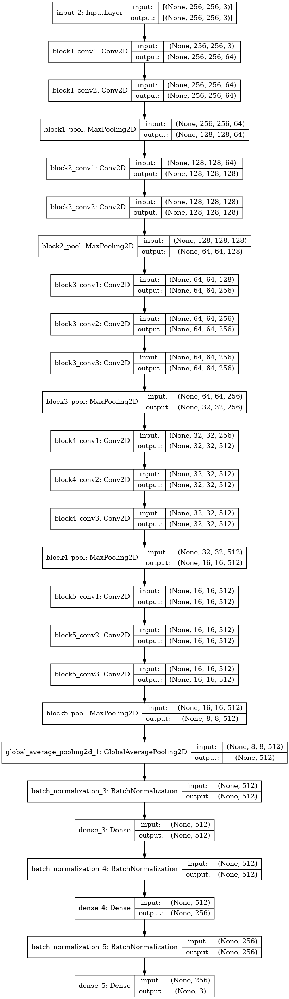

In [89]:
from keras.utils.vis_utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)

In [90]:
custom_early_stopping = EarlyStopping(
    monitor='val_categorical_accuracy', 
    patience=10, 
    min_delta=0.001, 
    mode='min'
)

In [91]:
history = model.fit(train_generator, 
                    epochs=100, 
                    validation_data=valid_generator,
                   callbacks=[custom_early_stopping])

Epoch 1/100
11/11 [==============================] - 41s 4s/step - loss: 1.2414 - categorical_accuracy: 0.4654 - val_loss: 0.9753 - val_categorical_accuracy: 0.9855
Epoch 2/100
11/11 [==============================] - 37s 3s/step - loss: 0.9647 - categorical_accuracy: 0.5973 - val_loss: 0.9573 - val_categorical_accuracy: 0.9798
Epoch 3/100
11/11 [==============================] - 36s 3s/step - loss: 0.9297 - categorical_accuracy: 0.6218 - val_loss: 0.9427 - val_categorical_accuracy: 0.9191
Epoch 4/100
11/11 [==============================] - 36s 3s/step - loss: 0.8262 - categorical_accuracy: 0.6643 - val_loss: 0.9301 - val_categorical_accuracy: 0.8006
Epoch 5/100
11/11 [==============================] - 36s 3s/step - loss: 0.7599 - categorical_accuracy: 0.7061 - val_loss: 0.9460 - val_categorical_accuracy: 0.5838
Epoch 6/100
11/11 [==============================] - 36s 3s/step - loss: 0.7243 - categorical_accuracy: 0.7197 - val_loss: 0.9656 - val_categorical_accuracy: 0.4191
Epoch 7/10

Accuracy plot

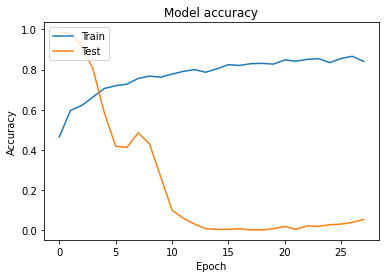

In [92]:
#plot accuracy vs epoch
plt.plot(history.history['categorical_accuracy']) #sparse_categorical_accuracy
plt.plot(history.history['val_categorical_accuracy']) #val_sparse_categorical_accuracy
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

Loss plot

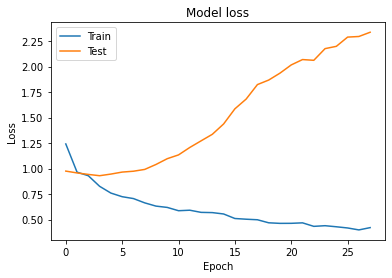

In [93]:
# Plot loss values vs epoch
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

              precision    recall  f1-score   support

        acne       0.66      0.98      0.79       312
      atopic       0.90      0.07      0.14       123
      herpes       0.76      0.44      0.56       102

    accuracy                           0.67       537
   macro avg       0.77      0.50      0.49       537
weighted avg       0.73      0.67      0.59       537



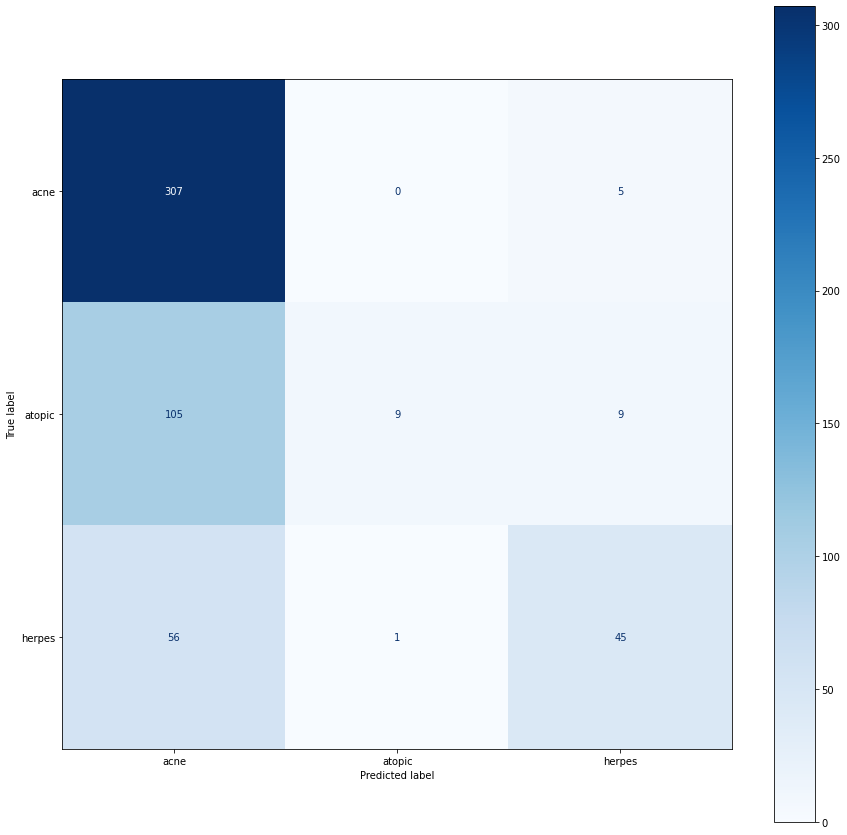

Precision: [0.65598291 0.9        0.76271186]
Recall: [0.98397436 0.07317073 0.44117647]
F1 score: [0.78717949 0.13533835 0.55900621]
Specificity: 1.0
Average Precision: 0.7728982567965619
Average Recall: 0.4994405204233037
Average F1 score: 0.49384134807475766
Average Specificity: 1.0


In [94]:
from sklearn.metrics import classification_report
test_true=test_generator.classes
test_pred_raw = model.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

class_names = list(test_generator.class_indices.keys())
print(classification_report(test_true, test_pred, target_names=class_names))


cm = confusion_matrix(test_true, test_pred)
precision = np.diag(cm) / np.sum(cm, axis=0)
recall = np.diag(cm) / np.sum(cm, axis=1)
f1_score = 2 * (precision * recall) / (precision + recall)
tn, fp, fn, tp, _, _, _, _, _ = cm.ravel()

specificity = tn / (tn + fp)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['acne','atopic','herpes'])
fig, ax = plt.subplots(figsize=(15,15))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()


# Print evaluation metrics
print('Precision:', precision)
print('Recall:', recall)
print('F1 score:', f1_score)
print('Specificity:', specificity)
print('Average Precision:', np.mean(precision))
print('Average Recall:', np.mean(recall))
print('Average F1 score:', np.mean(f1_score))
print('Average Specificity:', np.mean(specificity))

In [95]:
result = model.evaluate(test_generator,batch_size=32)
print("test_loss, test accuracy",result)

537/537 [==============================] - 6s 10ms/step - loss: 0.8542 - categorical_accuracy: 0.6723
test_loss, test accuracy [0.8542425036430359, 0.6722532510757446]


In [96]:
vgg_preds = model.predict(test_generator)
vgg_pred_classes = np.argmax(vgg_preds, axis=1)

In [97]:
true_classes = test_generator.classes
class_indices = train_generator.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())


vgg_acc = accuracy_score(true_classes, vgg_pred_classes)
print("VGG16 Model Accuracy: {:.2f}%".format(vgg_acc * 100))

VGG16 Model Accuracy: 67.23%


In [98]:
# Test dataset accuracy is 69.6%

In [99]:
img = tf.keras.utils.load_img(
    '../input/dermnet/test/Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions/actinic-keratosis-5FU-32.jpg',
    target_size=(256, 256)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

In [100]:
score = tf.nn.softmax(predictions[0])

class_names = list(train_generator.class_indices)

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

This image most likely belongs to atopic with a 57.61 percent confidence.


In [101]:
from keras.preprocessing import image
def predict_image_class(image_path,true_value):

    img = cv2.imread(image_path)
    img = cv2.resize(img,(256,256))

    img = np.expand_dims(img, axis=0)

    img_class = model.predict(img, batch_size=1)
    
    score = tf.nn.softmax(img_class[0])

    class_names = list(train_generator.class_indices)

    print(
        "This image most likely belongs to {}"
        .format(class_names[np.argmax(score)])
    )
    
    
    # for folder_name in our_folders:
    fig = plt.figure(1, figsize=(15, 15))
    grid = ImageGrid(fig, 111, nrows_ncols=(1, 1), axes_pad=0.05)
    ax = grid[0]
    img = image.load_img(image_path, (256, 256))
    img = image.img_to_array(img)
    ax.imshow(img / 255.)
    
    ax.text(10, 150, 'True Label: %s' % true_value.upper(), color='g', backgroundcolor='w',\
    alpha=0.8, size = 20)
    
    ax.text(10, 200, 'Predicted Label: %s' % class_names[np.argmax(score)].upper(), color='k', backgroundcolor='w',\
    alpha=0.8, size = 20)
    ax.axis('off')
    plt.show()

This image most likely belongs to atopic


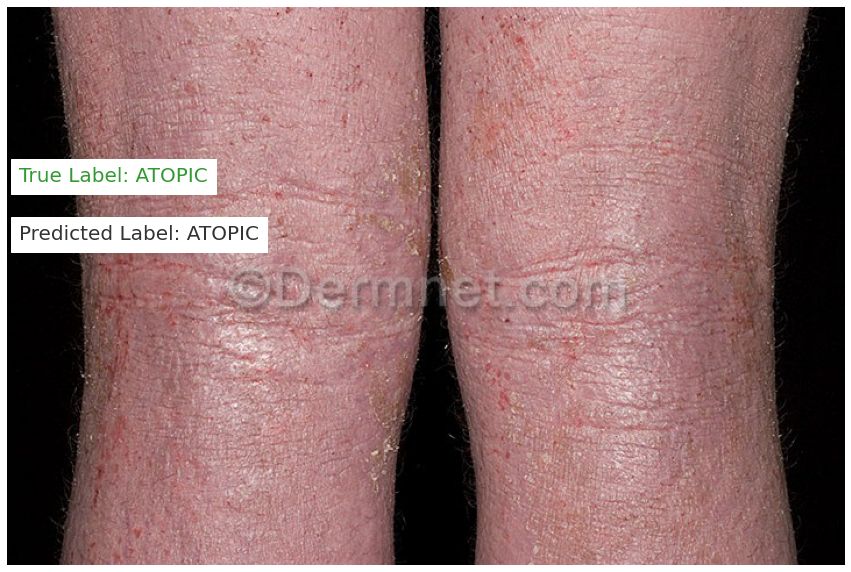

In [102]:
predict_image_class('/kaggle/input/dermnet/test/Atopic Dermatitis Photos/05Atopic12060426.jpg','atopic')

This image most likely belongs to herpes


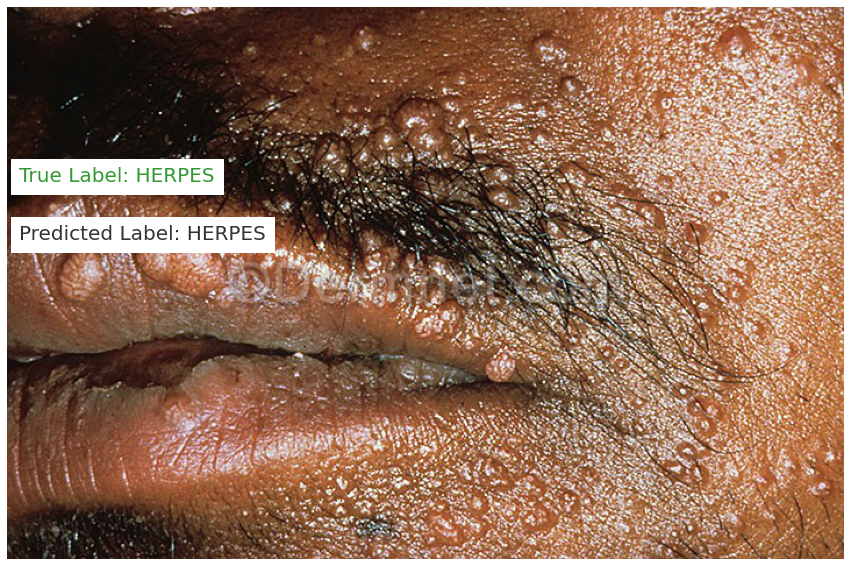

In [103]:
predict_image_class('/kaggle/input/dermnet/test/Herpes HPV and other STDs Photos/AIDS-6.jpg','Herpes')

This image most likely belongs to acne


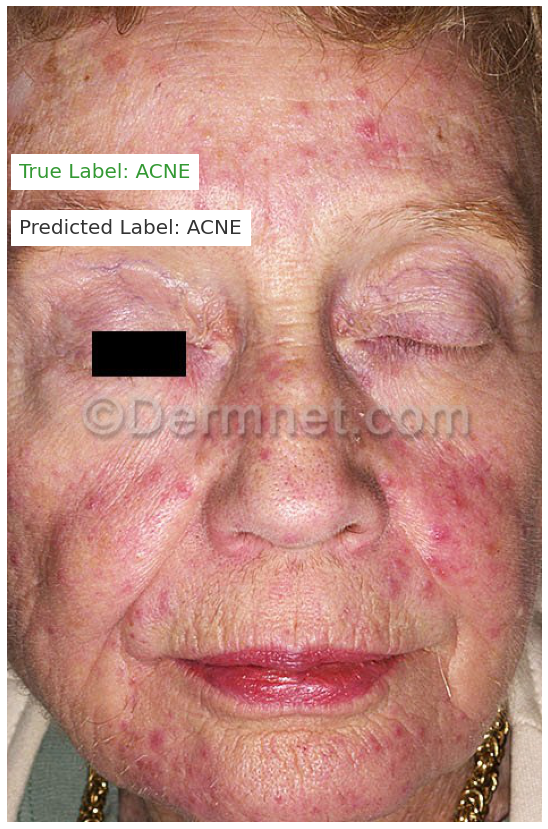

In [104]:
predict_image_class('../input/dermnet/test/Acne and Rosacea Photos/07RosaceaFulFAce.jpg','Acne')

This image most likely belongs to herpes


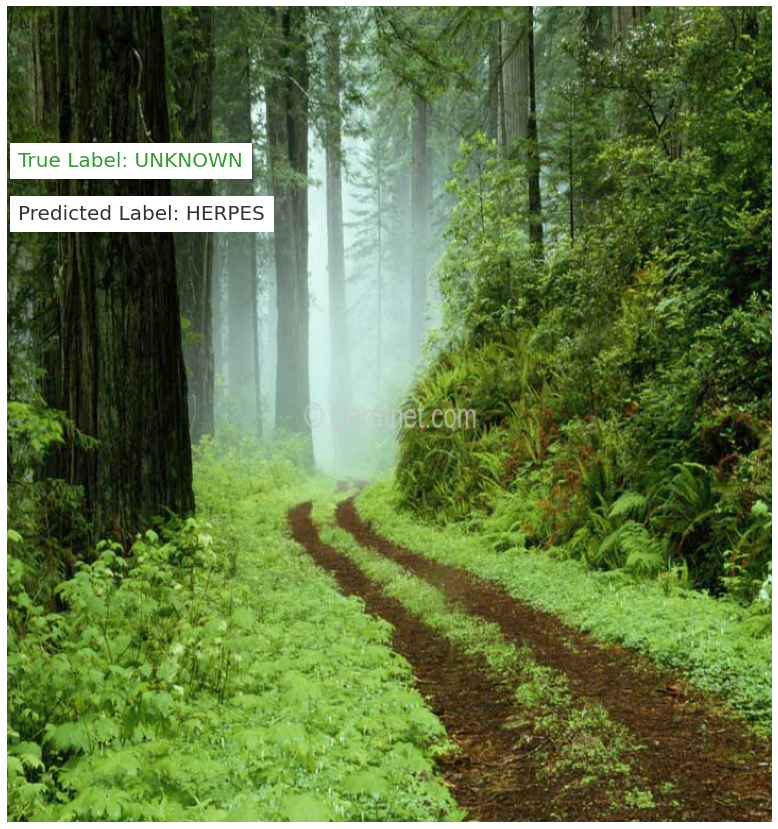

In [105]:
# Wrong predictions
predict_image_class('../input/dermnet/test/Acne and Rosacea Photos/Forest-2.jpg','unknown')